# How to integrate across all sources

## Step 1: Merge and integrate across all sources

Run `scripts/singularity_filteredGenes_merge_all_rmClust.R` through a SLURM job, which will take ~220G memory and ~4 hours. <br>
At this step, we utilized the Rds objects of samples per tissue source obtained at the doublet detection steps, and remove all doublets and clusters with doublet rates > 65%.

We used Harmony to correct for `"sex", "bmi", "age", "chemistry", "study", "treatments", "source"` covariates.

## Step 2: Inspect clusters after integration across all sources

In [1]:
library(Seurat)
library(ggplot2)
suppressPackageStartupMessages(library(dplyr))
library(glue)
suppressPackageStartupMessages(library(S4Vectors))
suppressPackageStartupMessages(library(GenomicRanges))
library(patchwork)
library(biomaRt)
library(harmony)

Attaching SeuratObject

Loading required package: Rcpp



### Step 2.1: Merge metadata with harmonized object

In [1]:
harmonized_data <- readRDS("/nfs/turbo/umms-scjp-pank/4_integration/results/202503_freeze/202504_freeze/min.cells1_min.features1_rmIndivDblts_rmClustAbv65pct_harmonized_data.Rds")
print(harmonized_data)

An object of class Seurat 
19546 features across 481154 samples within 1 assay 
Active assay: RNA (19546 features, 2000 variable features)
 3 dimensional reductions calculated: pca, umap, harmony


Get metadata for all cells. Metadata of cells in individual samples are obtained using `1_getMetrics.ipynb`:
```
metrics <- data.frame(matrix(ncol = 12))
colnames(metrics) <- c("barcode", "rna_total_reads", "rna_uniquely_mapped_reads", "rna_secondary_alignments",
                       "rna_supplementary_alignments", "rna_umis", "rna_fraction_mitochondrial",
                       "cell_probability", "post_cellbender_umis", "pct_cellbender_removed", "rna_pct_mitochondrial", "samples")

files <- list.files("/nfs/turbo/umms-scjp-pank/4_integration/data/202503_freeze/metrics/", pattern = "_metrics.csv")
for (f in files) {
    donor <- gsub("_metrics.csv", "", f)
    m <- read.table(paste0("/nfs/turbo/umms-scjp-pank/4_integration/data/202503_freeze/metrics/",
                           donor, "_metrics.csv"), sep = ",", header = T)
    m$samples <- donor
    m <- m[m$barcode %in% 
                       harmonized_data@meta.data[harmonized_data@meta.data$samples == donor, "barcodes"],]
    metrics <- rbind(metrics, m)
}

metrics <- metrics[!is.na(metrics$barcode),]

dim(metrics)

saveRDS(metrics, file = "/nfs/turbo/umms-scjp-pank/4_integration/results/202503_freeze/min.cells1_min.features1_rmIndivDblts_metrics.Rds")
```

In [2]:
metrics <- readRDS("/nfs/turbo/umms-scjp-pank/4_integration/results/202503_freeze/202504_freeze/min.cells1_min.features1_rmIndivDblts_rmClustAbv65pct_metrics.Rds")

In [5]:
harmonized_data@meta.data <- inner_join(harmonized_data@meta.data, metrics,
                                        by = c("barcodes" = "barcode", "samples" = "samples")) # add metadata
rownames(harmonized_data@meta.data) <- harmonized_data@meta.data$rownames
head((harmonized_data@meta.data))

,orig.ident,nCount_RNA,nFeature_RNA,rownames,samples,barcodes,study,rrid,treatments,chemistry,⋯,RNA_snn_res.1.8,rna_total_reads,rna_uniquely_mapped_reads,rna_secondary_alignments,rna_supplementary_alignments,rna_umis,cell_probability,post_cellbender_umis,pct_cellbender_removed,rna_pct_mitochondrial
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<fct>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRR12831418-TGACAACTCTGTCTAT,SeuratProject,6305,2608,SRR12831418-TGACAACTCTGTCTAT,SRR12831418,TGACAACTCTGTCTAT,GSE159556,HPAP-066,infected_with_SARS-CoV-2,V2,⋯,8,99915,88755,13865,0,11029,0.9999546,10826,1.840602,3.329390
SRR12831418-CTCAGAATCAGGCCCA,SeuratProject,3535,960,SRR12831418-CTCAGAATCAGGCCCA,SRR12831418,CTCAGAATCAGGCCCA,GSE159556,HPAP-066,infected_with_SARS-CoV-2,V2,⋯,49,88383,77301,14262,0,8071,0.9999546,7793,3.444431,5.160347
SRR12831418-TCAACGAGTATTCTCT,SeuratProject,4654,2373,SRR12831418-TCAACGAGTATTCTCT,SRR12831418,TCAACGAGTATTCTCT,GSE159556,HPAP-066,infected_with_SARS-CoV-2,V2,⋯,29,108557,99259,9832,0,8029,0.9999546,7794,2.926890,4.260571
SRR12831418-ATCCGAATCGTTTATC,SeuratProject,4258,1702,SRR12831418-ATCCGAATCGTTTATC,SRR12831418,ATCCGAATCGTTTATC,GSE159556,HPAP-066,infected_with_SARS-CoV-2,V2,⋯,8,71828,63288,12549,0,7759,0.9999546,7538,2.848305,6.084882
SRR12831418-AACACGTGTCCAGTAT,SeuratProject,3847,1675,SRR12831418-AACACGTGTCCAGTAT,SRR12831418,AACACGTGTCCAGTAT,GSE159556,HPAP-066,infected_with_SARS-CoV-2,V2,⋯,8,74127,65100,12656,0,7298,0.9999546,7084,2.932310,6.259601
SRR12831418-ATTGGTGGTGGCCCTA,SeuratProject,2936,760,SRR12831418-ATTGGTGGTGGCCCTA,SRR12831418,ATTGGTGGTGGCCCTA,GSE159556,HPAP-066,infected_with_SARS-CoV-2,V2,⋯,49,90761,75916,21978,0,6412,0.9999546,6130,4.398004,4.477317


### Step 2.2: Plot harmonized data

In [6]:
markers <- c('INS', 'IAPP', #Beta
             'GCG', #Alpha
             'SST', #Delta
             'PPY', #Gamma
             'GHRL', #Epsilon
             'KRT19', #Ductal
             'MUC5B', #MUC5B+ Ductal
             'REG1A', 'CTRB2', 'PRSS1', 'PRSS2', "CPA1", #Acinar
             'PDGFRB', 'COL6A1', 'RGS5', #Stellate
             'PECAM1', 'PLVAP','ESAM','VWF', #Endothelial
             'PTPRC', #Immune,
             'MKI67','CDK1') #Dividing cells

In [7]:
Idents(harmonized_data) <- as.factor(harmonized_data@meta.data$`RNA_snn_res.1.8`)
Idents(harmonized_data) <- factor(Idents(harmonized_data), levels=1:max(as.numeric(Idents(harmonized_data))))
harmonized_data$seurat_clusters <- factor(Idents(harmonized_data), levels=1:max(as.numeric(Idents(harmonized_data))))

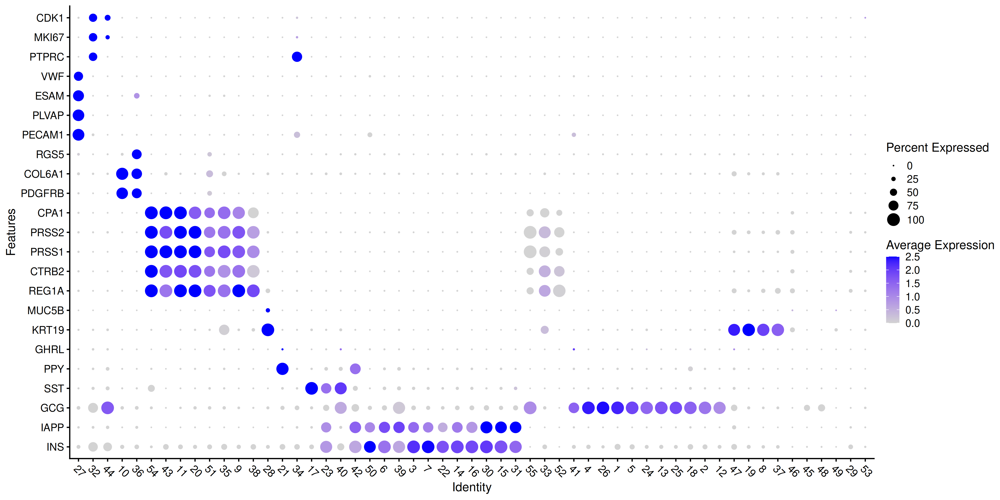

In [8]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 300)

DotPlot(harmonized_data, features = markers, cluster.idents = TRUE, col.min = 0, scale = T) +
  theme(axis.text.x = element_text(angle = -45, hjust = 0)) + coord_flip()

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



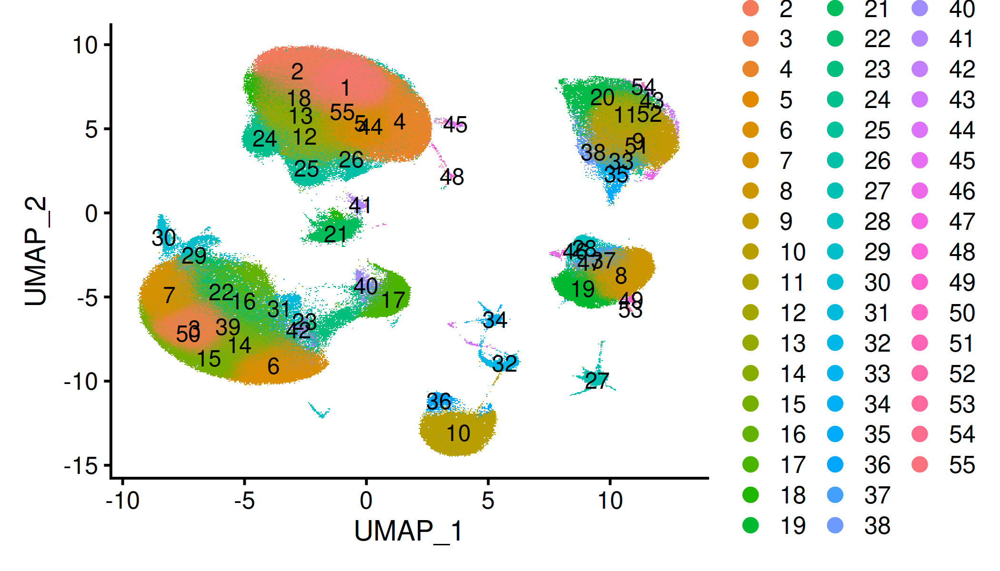

In [9]:
options(repr.plot.width = 7, repr.plot.height = 4, repr.plot.res = 300)
DimPlot(harmonized_data, label = T, repel = F)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To di

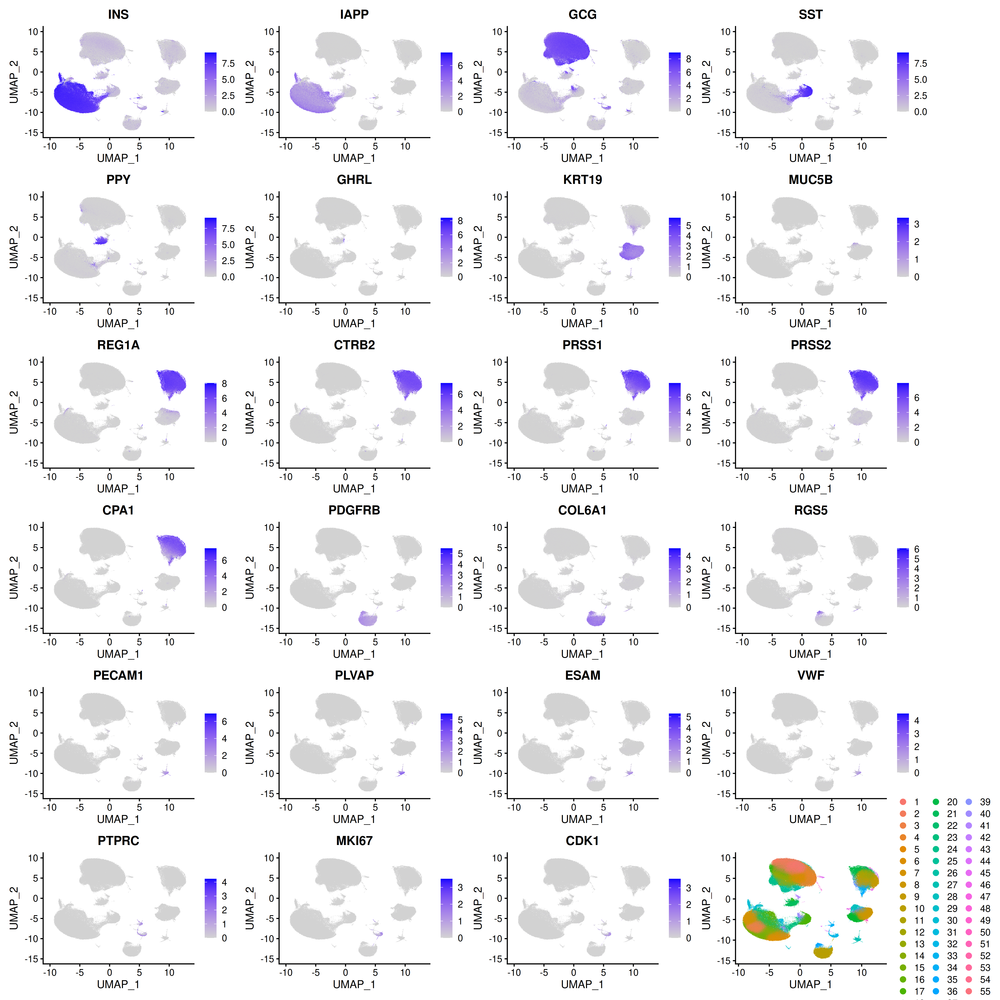

In [10]:
p1 <- DimPlot(harmonized_data, label = F)
p <- FeaturePlot(harmonized_data, features = markers) + p1

options(repr.plot.width = 18, repr.plot.height = 18, repr.plot.res = 300)
p

In [11]:
data.frame(table(Idents(harmonized_data)))

Var1,Freq
<fct>,<int>
1,48229
2,31079
3,29546
4,29422
5,26077
6,24354
7,21804
8,21428
9,21142


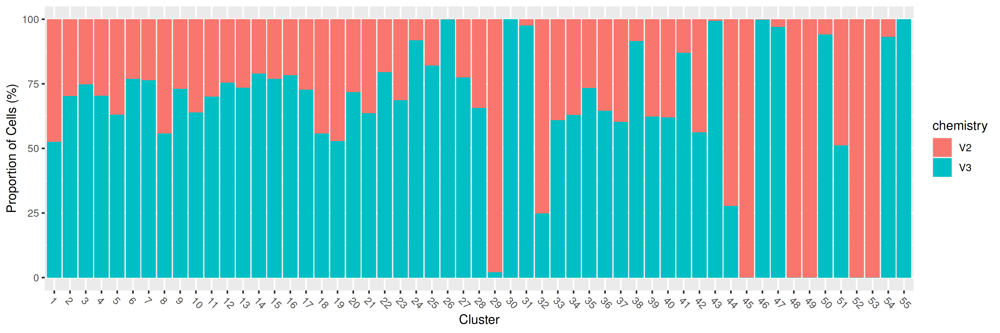

In [12]:
options(repr.plot.width = 12, repr.plot.height = 4, repr.plot.res = 300)

ggData = data.frame(prop.table(table(harmonized_data$chemistry, harmonized_data$seurat_clusters), margin = 2))
colnames(ggData) = c("chemistry", "cluster", "value")
ggplot(ggData, aes(cluster, value*100, fill = chemistry)) + theme(axis.text.x = element_text(angle = -45, hjust = 0)) +
  geom_col() + xlab("Cluster") + ylab("Proportion of Cells (%)")

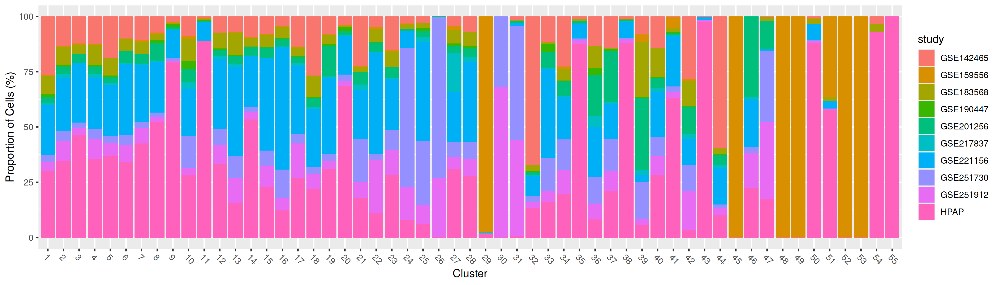

In [13]:
options(repr.plot.width = 14, repr.plot.height = 4, repr.plot.res = 300)

ggData = data.frame(prop.table(table(harmonized_data$study, harmonized_data$seurat_clusters), margin = 2))
colnames(ggData) = c("study", "cluster", "value")
ggplot(ggData, aes(cluster, value*100, fill = study)) + theme(axis.text.x = element_text(angle = -45, hjust = 0)) +
  geom_col() + xlab("Cluster") + ylab("Proportion of Cells (%)")

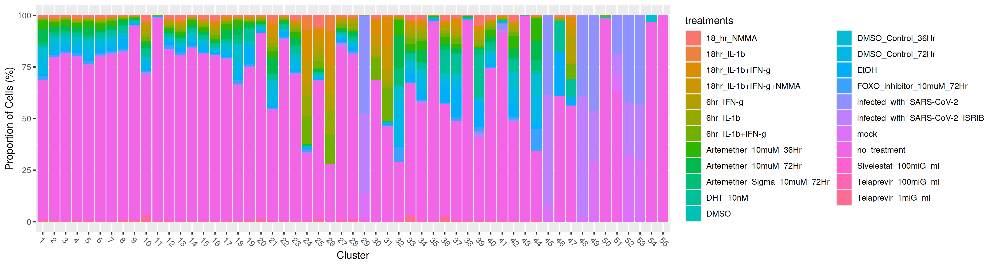

In [14]:
options(repr.plot.width = 15, repr.plot.height = 4, repr.plot.res = 300)

ggData = data.frame(prop.table(table(harmonized_data$treatments, harmonized_data$seurat_clusters), margin = 2))
colnames(ggData) = c("treatments", "cluster", "value")
ggplot(ggData, aes(cluster, value*100, fill = treatments)) + theme(axis.text.x = element_text(angle = -45, hjust = 0)) +
  geom_col() + xlab("Cluster") + ylab("Proportion of Cells (%)")

### Step 2.3: Plot QC metrics and test for significant differences in distributions of QC metrics

#### %chrMT reads

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



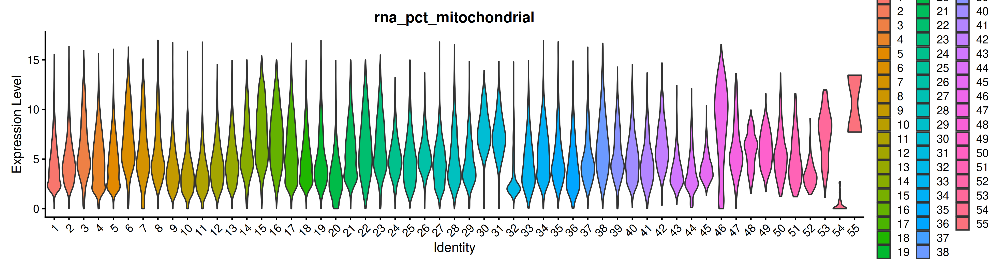

In [15]:
options(repr.plot.width = 15, repr.plot.height = 4, repr.plot.res = 300)
# Visualize QC metrics as a violin plot
VlnPlot(harmonized_data, features = c("rna_pct_mitochondrial"), ncol = 1, pt.size = 0)

Using Wilcoxin rank sum test to identify clusters with significantly different %chMT read profiles than the rest of the clusters. A cluster is significantly different if their `adj. p-value < 0.05` and fold change (i.e. `median %chrMT reads / median %chrMT reads of all other clusters`) `< 1/2`).

In [16]:
df <- data.frame(cluster = unique(harmonized_data$seurat_clusters),
                 median_rna_pct_mitochondrial = NA, median_others_rna_pct_mitochondrial = NA,
                 pval_rna_pct_mitochondrial = NA)
for (i in unique(harmonized_data$seurat_clusters)) {
    w <- wilcox.test(harmonized_data@meta.data[harmonized_data$seurat_clusters == i, "rna_pct_mitochondrial"],
       y = harmonized_data@meta.data[harmonized_data$seurat_clusters != i, "rna_pct_mitochondrial"],
       alternative = c("two.sided"))
    df[df$cluster == i, "pval_rna_pct_mitochondrial"] <- w$p.value
    df[df$cluster == i, "median_rna_pct_mitochondrial"] <- median(harmonized_data@meta.data[harmonized_data$seurat_clusters == i, "rna_pct_mitochondrial"])
    df[df$cluster == i, "median_others_rna_pct_mitochondrial"] <- median(harmonized_data@meta.data[harmonized_data$seurat_clusters != i, "rna_pct_mitochondrial"])
}
df$adj_pval_rna_pct_mitochondrial <- p.adjust(df$pval_rna_pct_mitochondrial, method = "BH", n = length(df$pval_rna_pct_mitochondrial))
df$fold_rna_pct_mitochondrial <- df$median_others_rna_pct_mitochondrial / df$median_rna_pct_mitochondrial

No cluster needs to be removed based on the %chrMT read profiles.

In [17]:
a <- df[(df$adj_pval_rna_pct_mitochondrial < 0.05) &
        df$fold_rna_pct_mitochondrial < 1/2,]
a <- a[order(a$cluster),]
a

cluster,median_rna_pct_mitochondrial,median_others_rna_pct_mitochondrial,pval_rna_pct_mitochondrial,adj_pval_rna_pct_mitochondrial,fold_rna_pct_mitochondrial
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>


#### nFeature_RNA and nCount_RNA

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



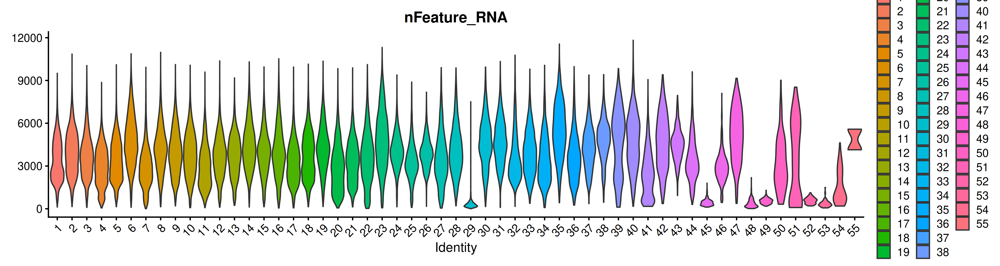

In [18]:
# Visualize QC metrics as a violin plot
options(repr.plot.width = 15, repr.plot.height = 4, repr.plot.res = 300)
VlnPlot(harmonized_data, features = c("nFeature_RNA"), ncol = 1, pt.size = 0)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



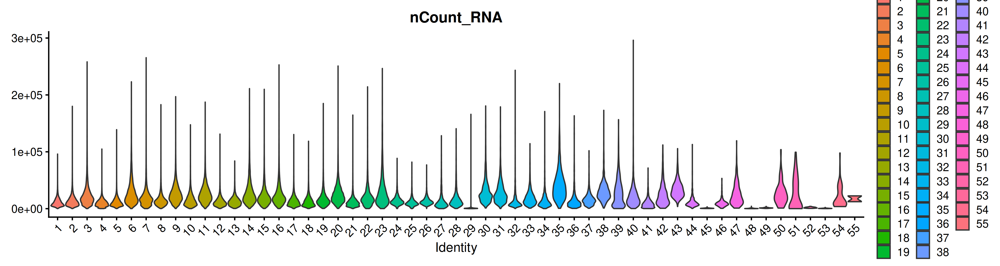

In [19]:
# Visualize QC metrics as a violin plot
VlnPlot(harmonized_data, features = c("nCount_RNA"), ncol = 1, pt.size = 0)

Using Wilcoxin rank sum test to identify clusters with significantly different `nCount_RNA` (number of UMIs) and `nFeature_RNA` (number of genes) profiles than the rest of the clusters. A cluster is significantly different if their `adj. p-value < 0.05` and fold change (i.e. `median nCount / median nCount of all other clusters`) `> 2` and `median nFeature / median nFeature of all other clusters`) `> 2`).

In [20]:
df <- data.frame(cluster = unique(harmonized_data$seurat_clusters),
                 median_nFeature_RNA = NA, median_others_nFeature_RNA = NA,
                 pval_nFeature_RNA = NA, 
                 median_nCount_RNA = NA, median_others_nCount_RNA = NA,
                 pval_nCount_RNA = NA)
for (i in unique(harmonized_data$seurat_clusters)) {
    w <- wilcox.test(harmonized_data@meta.data[harmonized_data$seurat_clusters == i, "nFeature_RNA"],
       y = harmonized_data@meta.data[harmonized_data$seurat_clusters != i, "nFeature_RNA"],
       alternative = c("two.sided"))
    df[df$cluster == i, "pval_nFeature_RNA"] <- w$p.value
    df[df$cluster == i, "median_nFeature_RNA"] <- median(harmonized_data@meta.data[harmonized_data$seurat_clusters == i, "nFeature_RNA"])
    df[df$cluster == i, "median_others_nFeature_RNA"] <- median(harmonized_data@meta.data[harmonized_data$seurat_clusters != i, "nFeature_RNA"])
    
    w <- wilcox.test(harmonized_data@meta.data[harmonized_data$seurat_clusters == i, "nCount_RNA"],
       y = harmonized_data@meta.data[harmonized_data$seurat_clusters != i, "nCount_RNA"],
       alternative = c("two.sided"))
    df[df$cluster == i, "pval_nCount_RNA"] <- w$p.value
    df[df$cluster == i, "median_nCount_RNA"] <- median(harmonized_data@meta.data[harmonized_data$seurat_clusters == i, "nCount_RNA"])
    df[df$cluster == i, "median_others_nCount_RNA"] <- median(harmonized_data@meta.data[harmonized_data$seurat_clusters != i, "nCount_RNA"])
}

In [21]:
df$adj_pval_nFeature_RNA <- p.adjust(df$pval_nFeature_RNA, method = "BH", n = length(df$pval_nFeature_RNA))
df$fold_nFeature_RNA <- df$median_others_nFeature_RNA / df$median_nFeature_RNA

df$adj_pval_nCount_RNA <- p.adjust(df$pval_nCount_RNA, method = "BH", n = length(df$pval_nCount_RNA))
df$fold_nCount_RNA <- df$median_others_nCount_RNA / df$median_nCount_RNA

a <- df[(df$adj_pval_nFeature_RNA < 0.05 & df$fold_nFeature_RNA > 2) &
        (df$adj_pval_nCount_RNA < 0.05 & df$fold_nCount_RNA > 2),]
a <- a[order(a$cluster),]
a

,cluster,median_nFeature_RNA,median_others_nFeature_RNA,pval_nFeature_RNA,median_nCount_RNA,median_others_nCount_RNA,pval_nCount_RNA,adj_pval_nFeature_RNA,fold_nFeature_RNA,adj_pval_nCount_RNA,fold_nCount_RNA
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
3,29,264.0,3637,0.000000e+00,649.0,13650.0,0.000000e+00,0.000000e+00,13.776515,0.000000e+00,21.032357
9,45,409.5,3624,7.147556e-308,712.0,13575.0,0.000000e+00,3.573778e-307,8.849817,0.000000e+00,19.066011
5,48,292.5,3623,1.197545e-186,393.0,13570.5,1.462550e-191,3.466577e-186,12.386325,3.093856e-191,34.530534
2,49,544.0,3623,1.555890e-141,1253.0,13569.0,1.085787e-140,4.074949e-141,6.659926,1.990609e-140,10.829210
7,52,588.0,3622,3.588004e-72,1848.0,13566.0,4.928375e-69,6.578008e-72,6.159864,7.744590e-69,7.340909
14,53,301.5,3622,2.911180e-59,477.5,13566.0,1.815091e-60,5.003591e-59,12.013267,2.773056e-60,28.410471


In [22]:
a$cluster

[1] 29 45 48 49 52 53
55 Levels: 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 ... 55

We will remove cells in clusters 29, 45, 48, 49, 52, and 53 from downstream analysis due to significantly different profiles in `nCount` and `nFeature`. In order to do so, run `scripts/singularity_recluster_rmClust.R` through a SLURM job.

### Step 2.4: Inspect clusters post removing clusters w/ sign. low nFeature and nCount, remove clusters enriched with doublet-like cells

In [2]:
harmonized_data <- readRDS("/nfs/turbo/umms-scjp-pank/4_integration/results/202503_freeze/202504_freeze/filtered_round1__min.cells1_min.features1_rmIndivDblts_rmClustAbv65pct_harmonized_data.Rds")
print(harmonized_data)

An object of class Seurat 
19546 features across 476429 samples within 1 assay 
Active assay: RNA (19546 features, 2000 variable features)
 3 dimensional reductions calculated: pca, umap, harmony


In [3]:
Idents(harmonized_data) <- as.factor(harmonized_data@meta.data$`RNA_snn_res.3`)
Idents(harmonized_data) <- factor(Idents(harmonized_data), levels=1:max(as.numeric(Idents(harmonized_data))))
harmonized_data$seurat_clusters <- factor(Idents(harmonized_data), levels=1:max(as.numeric(Idents(harmonized_data))))

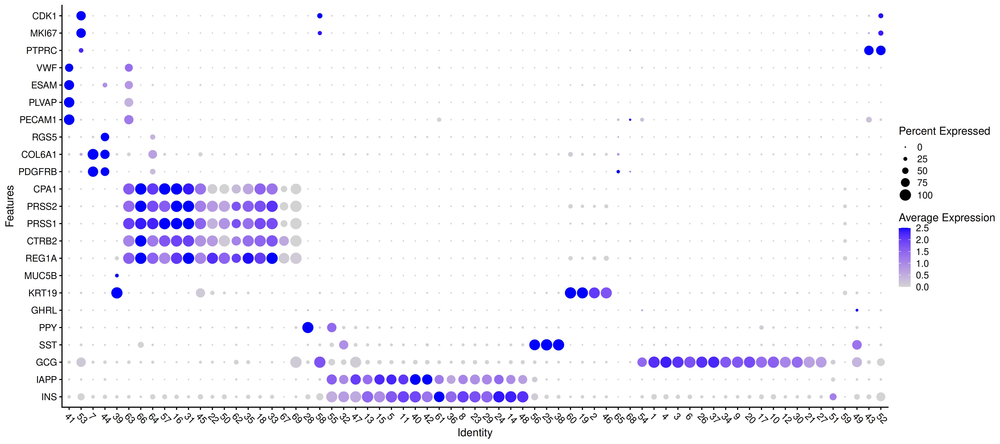

In [4]:
markers <- c('INS', 'IAPP', #Beta
             'GCG', #Alpha
             'SST', #Delta
             'PPY', #Gamma
             'GHRL', #Epsilon
             'KRT19', #Ductal
             'MUC5B', #MUC5B+ Ductal
             'REG1A', 'CTRB2', 'PRSS1', 'PRSS2', "CPA1", #Acinar
             'PDGFRB', 'COL6A1', 'RGS5', #Stellate
             'PECAM1', 'PLVAP','ESAM','VWF', #Endothelial
             'PTPRC', #Immune,
             'MKI67','CDK1') #Dividing cells
options(repr.plot.width = 18, repr.plot.height = 8, repr.plot.res = 300)

DotPlot(harmonized_data, features = markers, cluster.idents = TRUE, col.min = 0, scale = T) +
  theme(axis.text.x = element_text(angle = -45, hjust = 0)) + coord_flip()

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To di

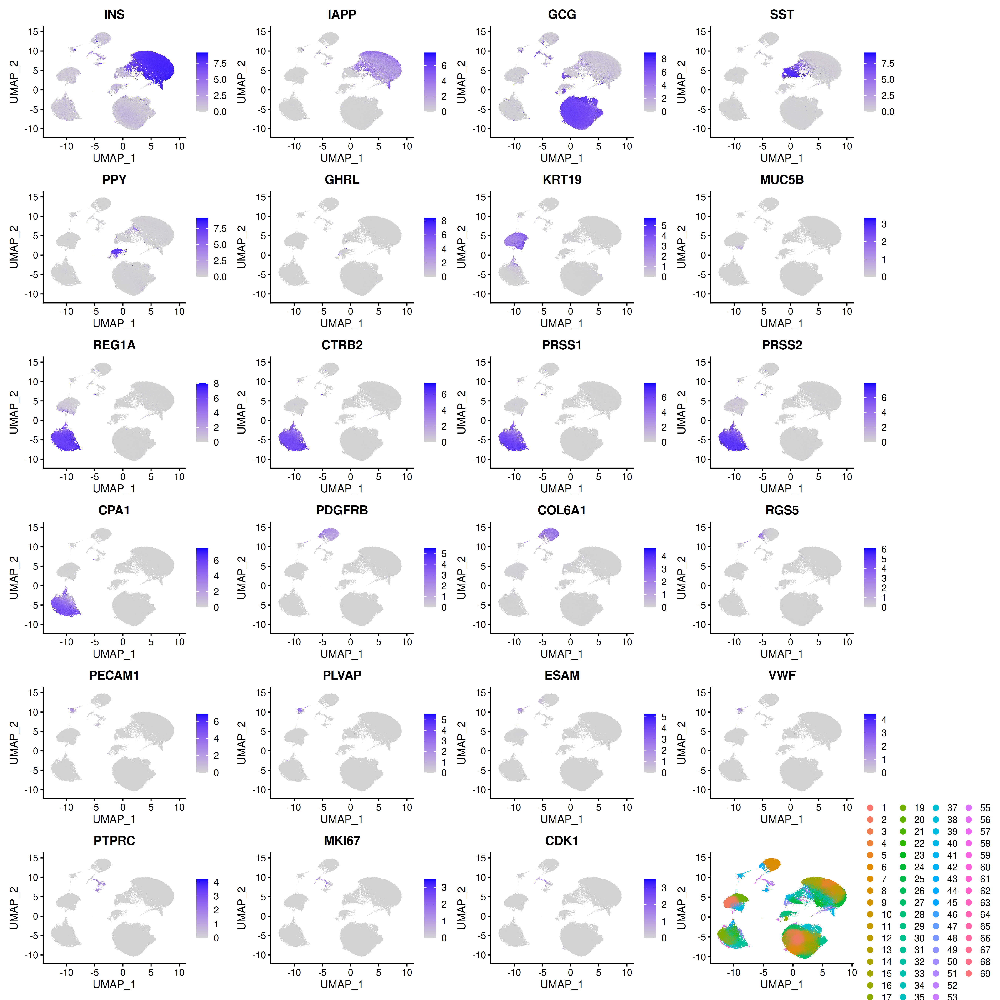

In [5]:
p1 <- DimPlot(harmonized_data, label = F)
p <- FeaturePlot(harmonized_data, features = markers) + p1

options(repr.plot.width = 18, repr.plot.height = 18, repr.plot.res = 300)
p

From the dot plot and feature plots, we can see some clusters expressed double markers. To make sure these cells are not doublet-like cells where they have more UMI numbers than expected and express multiple markers, we carry out the following analysis:

For each sample, we began by clustering cells at a resolution of 4. We pinpointed clusters that 1) were enriched with cells exhibiting high UMI counts (test 1) and 2) expressing markers from at least two cell populations in 50% or more of the cells (test 2). To identify clusters satisfied test 1, we performed Binomial tests to assess whether a cluster had more cells with UMI counts exceeding the 90th percentile of the samples than the expected rate of 0.1, using a Benjamini-Hochberg adjusted P-value threshold of < 0.05. Cells within these enriched clusters were labeled as "doublet-like cells." 

In order to do this analysis on a sample-level, run `scripts/enriched_clusters.R` through a Snakemake job. See `scripts/snakefile` for an example Snakemake file.

We cab associate the doublet-like assignment to the current single cell object as follows:

In [6]:
enriched_cells <- read.table("/nfs/turbo/umms-scjp-pank/4_integration/results/202503_freeze/doublet_like/202504_freeze/enriched_cells/allEnrichedClust.txt", header = F)
enriched_cells$V1 <- gsub("_", "-", enriched_cells$V1)

In [7]:
harmonized_data$dbl_like_cells <- ifelse(rownames(harmonized_data@meta.data) %in% enriched_cells$V1, "True", "False")

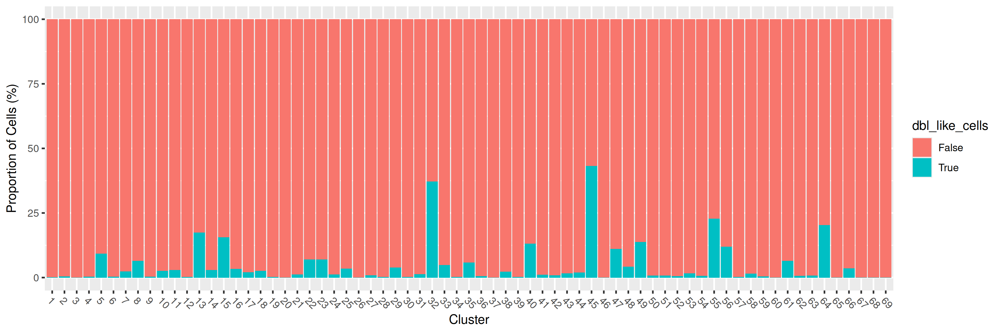

In [8]:
options(repr.plot.width = 12, repr.plot.height = 4, repr.plot.res = 300)
ggData = data.frame(prop.table(table(harmonized_data$dbl_like_cells, harmonized_data$seurat_clusters), margin = 2))
colnames(ggData) = c("dbl_like_cells", "cluster", "value")
ggplot(ggData, aes(cluster, value*100, fill = dbl_like_cells)) + theme(axis.text.x = element_text(angle = -45, hjust = 0)) +
  geom_col() + xlab("Cluster") + ylab("Proportion of Cells (%)")

Next, we employed Fisher’s exact test to identify clusters in the integrated map that were enriched with doublet-like cells (Benjamini-Hochberg adjusted P-value threshold of < 0.05). 

In [11]:
metadata <- harmonized_data@meta.data

In [13]:
### for Fishers exact test

df <- data.frame(cluster = unique(harmonized_data$seurat_clusters),
                 ncells = NA, 
                 a = NA, b = NA, c = NA, d = NA, p_val = NA)

for (s in unique(harmonized_data$seurat_clusters)) {
    df[df$cluster == s, "ncells"] <- length(metadata[metadata$dbl_like_cells == s, "barcodes"])
        
    a <- length(metadata[metadata$seurat_clusters == s & metadata$dbl_like_cells == "True", "barcodes"])
    n <- length(metadata[metadata$seurat_clusters == s, "barcodes"])
    b <- n - a
    c <- length(metadata[metadata$metadata <- harmonized_data@meta.data == "True", "barcodes"]) - a
    d <- length(metadata[metadata$seurat_clusters != s, "barcodes"]) - c
    
    df[df$cluster == s, "a"] <- a
    df[df$cluster == s, "b"] <- b
    df[df$cluster == s, "c"] <- c
    df[df$cluster == s, "d"] <- d
    
    t <- matrix(c(a, c, b, d), ncol = 2, dimnames = list(nCount = c("n_dbl_like_cells", "n_nondbl_like_cells"),
                                                        nCells = c("nCells_inCluster", "nCells_outCluster")))
    
    #Are there more cells with very high coverage in a cluster for a sample than expected
    if (n > 0) {
        test <- fisher.test(t(t), alternative = "greater")
        df[df$cluster == s, "p_val"] <- test$p.value
    } else {
        df[df$cluster == s, "p_val"] <- NA
    }
}
df$adj_pval <- p.adjust(df$p_val, method = "BH", n = length(df$p_val))
df$fold <- (df$a/(df$a+df$b)) / (df$c/(df$c+df$d))
df$rate <- df$a/df$b
df[df$adj_pval < 0.05 & df$fold > 2 & df$rate > 0.1,]

,cluster,ncells,a,b,c,d,p_val,adj_pval,fold,rate
,<fct>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
17,15,0,1862,10090,15755,448722,0.000000e+00,0.000000e+00,4.592878,0.1845391
19,5,0,1717,17026,15900,441786,2.028047e-261,2.798705e-260,2.636949,0.1008458
20,13,0,2440,11617,15177,447195,0.000000e+00,0.000000e+00,5.288138,0.2100370
30,47,0,208,1671,17409,457141,1.331342e-43,7.655214e-43,3.017482,0.1244764
35,32,0,2404,4063,15213,454749,0.000000e+00,0.000000e+00,11.483638,0.5916810
37,45,0,864,1140,16753,457672,0.000000e+00,0.000000e+00,12.209307,0.7578947
38,64,0,18,71,17599,458741,4.042007e-09,1.859323e-08,5.474085,0.2535211
48,49,0,242,1527,17375,457285,1.730291e-67,1.492376e-66,3.737192,0.1584807
51,55,0,211,717,17406,458095,2.043208e-100,2.014020e-99,6.211363,0.2942817


Clusters in the integrated map that both were enriched with doublet-like cells and expressed markers from at least two cell populations in 50% or more of the cells were subsequently removed. Additionally, all doublet-like cells were removed. This can be done using the script `scripts/singularity_recluster_rmClust_doublet-like.R`. The following is some snapshot of how the clusters are chosen for removal:

In [14]:
# shortened/nonredundant list of markers where each cell type has one marker
markers <- c('INS', #Beta
             'GCG', #Alpha
             'SST', #Delta
             'PPY', #Gamma
             'GHRL', #Epsilon
             'CFTR', #Ductal
             'PRSS1',#Acinar
             'PDGFRB', #Stellate
             'PLVAP' #Endothelial
             )
data <- DotPlot(harmonized_data, features = markers, cluster.idents = TRUE, col.min = 0, scale = T)

In [15]:
res <- df[df$adj_pval < 0.05,]
print(res$cluster) #clusters enriched with doublet-like cells

 [1] 22 15 23 5  13 33 47 8  32 45 64 49 55 40 35 56
69 Levels: 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 ... 69


In [16]:
a <- data$data[data$data$pct.exp > 50,]
b <- data.frame(table(a$id, a$features.plot)) %>% group_by(Var1) %>% summarise(n = sum(Freq))
cluster_data <- unique(b[b$n >= 2,]$Var1)
print(cluster_data) #clusters expressed markers from at least two cell populations in 50% or more of the cells

 [1] 56 55 32 47 63 45 58 69 52 53 49
69 Levels: 41 7 44 25 38 56 55 51 13 15 8 29 5 23 36 42 61 40 24 11 14 ... 49


In [17]:
c1 <- res$cluster
df$dbl_like_clusters <- ifelse(df$cluster %in% intersect(c1, cluster_data), "True", "False")

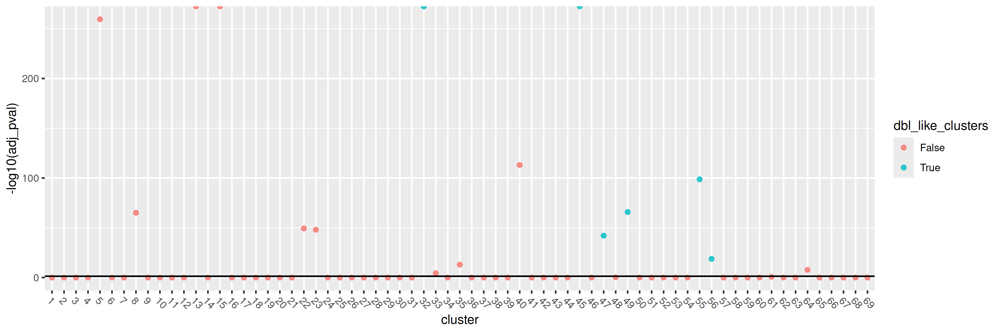

In [18]:
options(repr.plot.width = 12, repr.plot.height = 4, repr.plot.res = 300)
ggplot(df, aes(x = as.factor(cluster), y = -log10(adj_pval))) + geom_point(alpha = 0.8, aes(color = dbl_like_clusters)) +
    geom_hline(yintercept = -log10(0.05)) + xlab("cluster") + theme(axis.text.x = element_text(angle = -45, hjust = 0))

Clusters in blue dots will be removed, along with other individual "doublet-like" cells.